# Rate Bird clusters

In [1]:
import os
import numpy as np
import torch
import pandas as pd
import matplotlib.patches as mpatches

import matplotlib.pyplot as plt

In [2]:
dpath='/grand/projects/BirdAudio/Soundscapes/Complete_Data/'
if os.path.isfile(os.path.join(dpath, 'Data.csv')):
    print('Data already exists, loading it...')
    data = pd.read_csv(os.path.join(dpath, 'Data.csv'))
    print('Done!')
else:
    print('No Data.csv file')

data

Data already exists, loading it...
Done!


,Unnamed: 0,detection,confidence,year,month,day,hour,minute,second,week,weekday,device,set,paths,x,y,labels
0,0,No detection,1.000000,2021,6,28,17,0,0,26,1,23771,set1,set1/00023771/20210628_STUDY/20210628T170000-0...,-1.314544,2.506662,68
1,1,No detection,1.000000,2021,6,28,17,0,9,26,1,23771,set1,set1/00023771/20210628_STUDY/20210628T170000-0...,-1.477438,5.518093,49
2,2,Hairy Woodpecker,0.280230,2021,6,28,17,1,30,26,1,23771,set1,set1/00023771/20210628_STUDY/20210628T170000-0...,-3.349682,5.888462,90
3,3,Downy Woodpecker,0.126071,2021,6,28,17,1,30,26,1,23771,set1,set1/00023771/20210628_STUDY/20210628T170000-0...,-3.349682,5.888462,90
4,4,No detection,1.000000,2021,6,28,17,15,0,26,1,23771,set1,set1/00023771/20210628_STUDY/20210628T170000-0...,-2.395481,3.372900,47
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2456607,2456607,Blue Jay,0.221711,2021,7,22,16,54,45,29,4,23795,set2,set2/00023795/20210722_STUDY/20210722T164030-0...,-3.294346,1.410931,37
2456608,2456608,Blue Jay,0.107609,2021,7,22,16,54,54,29,4,23795,set2,set2/00023795/20210722_STUDY/20210722T164030-0...,-3.402299,2.353246,37
2456609,2456609,No detection,1.000000,2021,7,22,16,55,3,29,4,23795,set2,set2/00023795/20210722_STUDY/20210722T164030-0...,-3.009493,4.178609,47
2456610,2456610,No detection,1.000000,2021,7,22,16,55,12,29,4,23795,set2,set2/00023795/20210722_STUDY/20210722T164030-0...,-3.477466,5.271054,90


Text(0.5, 1.0, 'Bird detections')

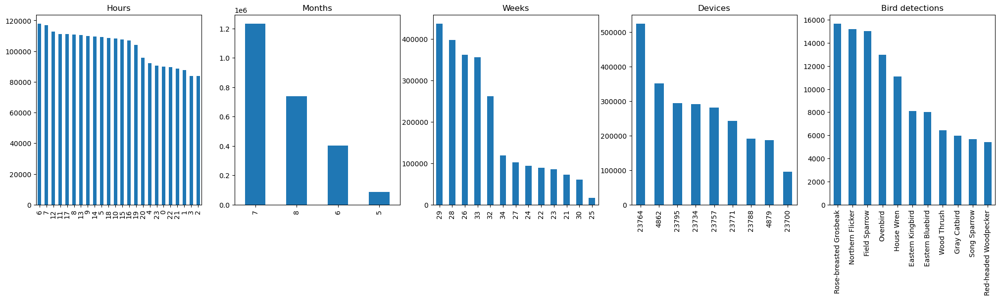

In [3]:
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(25, 5))
#df.labels.value_counts()[0:10].plot.bar(ax=axes[0])
data.hour.value_counts().plot.bar(ax=axes[0])
data.month.value_counts().plot.bar(ax=axes[1])
data.week.value_counts().plot.bar(ax=axes[2])
data.device.value_counts().plot.bar(ax=axes[3])
data.detection.value_counts()[20:31].plot.bar(ax=axes[4])

axes[0].set_title("Hours")
axes[1].set_title("Months")
axes[2].set_title("Weeks")
axes[3].set_title("Devices")
axes[4].set_title("Bird detections")


In [4]:
clusters=np.unique(data['labels'])
bird_rate_clusters=[]
for cluster in clusters:
    aux={}
    cluster_data=data[data['labels']==cluster]
    bird_detection_rate=cluster_data[cluster_data['detection']!='No detection'].shape[0]/cluster_data.shape[0]
    aux['cluster']=cluster
    aux['bird_detection_rate']=bird_detection_rate
    bird_rate_clusters.append(aux)
    
bird_rate_clusters = pd.DataFrame(data=bird_rate_clusters)
bird_rate_clusters

,cluster,bird_detection_rate
0,0,0.294481
1,1,0.336994
2,2,0.081762
3,3,0.686408
4,4,0.558243
...,...,...
95,95,0.579594
96,96,0.436075
97,97,0.436228
98,98,0.741366


<AxesSubplot: >

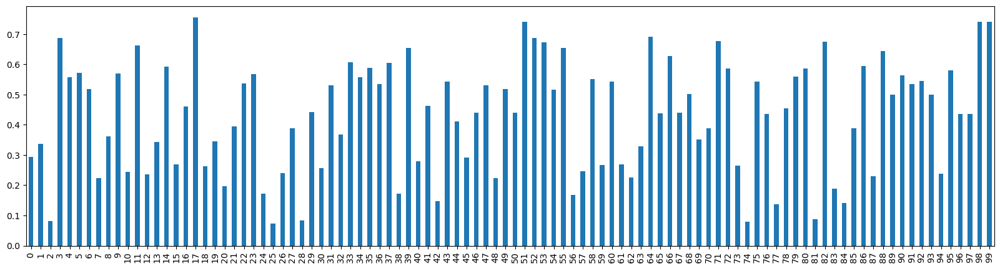

In [5]:
bird_rate_clusters['bird_detection_rate'].plot.bar(figsize=(20,5))

In [6]:
bird_rate_clusters[bird_rate_clusters['bird_detection_rate']>0.7]

,cluster,bird_detection_rate
17,17,0.755666
51,51,0.740867
98,98,0.741366
99,99,0.740901


Cluster  0
Bird detection rate  0.294480755265069
Cluster  2
Bird detection rate  0.08176247719724963
Cluster  7
Bird detection rate  0.2246066474257518
Cluster  10
Bird detection rate  0.2451686577652846
Cluster  12
Bird detection rate  0.2353909465020576
Cluster  15
Bird detection rate  0.269193201797226
Cluster  18
Bird detection rate  0.2629450985955455
Cluster  20
Bird detection rate  0.1967479674796748
Cluster  24
Bird detection rate  0.17122399211331915
Cluster  25
Bird detection rate  0.07301671530910056
Cluster  26
Bird detection rate  0.23997829232995657
Cluster  28
Bird detection rate  0.08268853216306733
Cluster  30
Bird detection rate  0.25653706529173465
Cluster  38
Bird detection rate  0.17290182106096597
Cluster  40
Bird detection rate  0.27980635102978585
Cluster  42
Bird detection rate  0.1467232823451169
Cluster  45
Bird detection rate  0.29211251072283173
Cluster  48
Bird detection rate  0.2235313640889479
Cluster  56
Bird detection rate  0.16808404202101052
Cluster

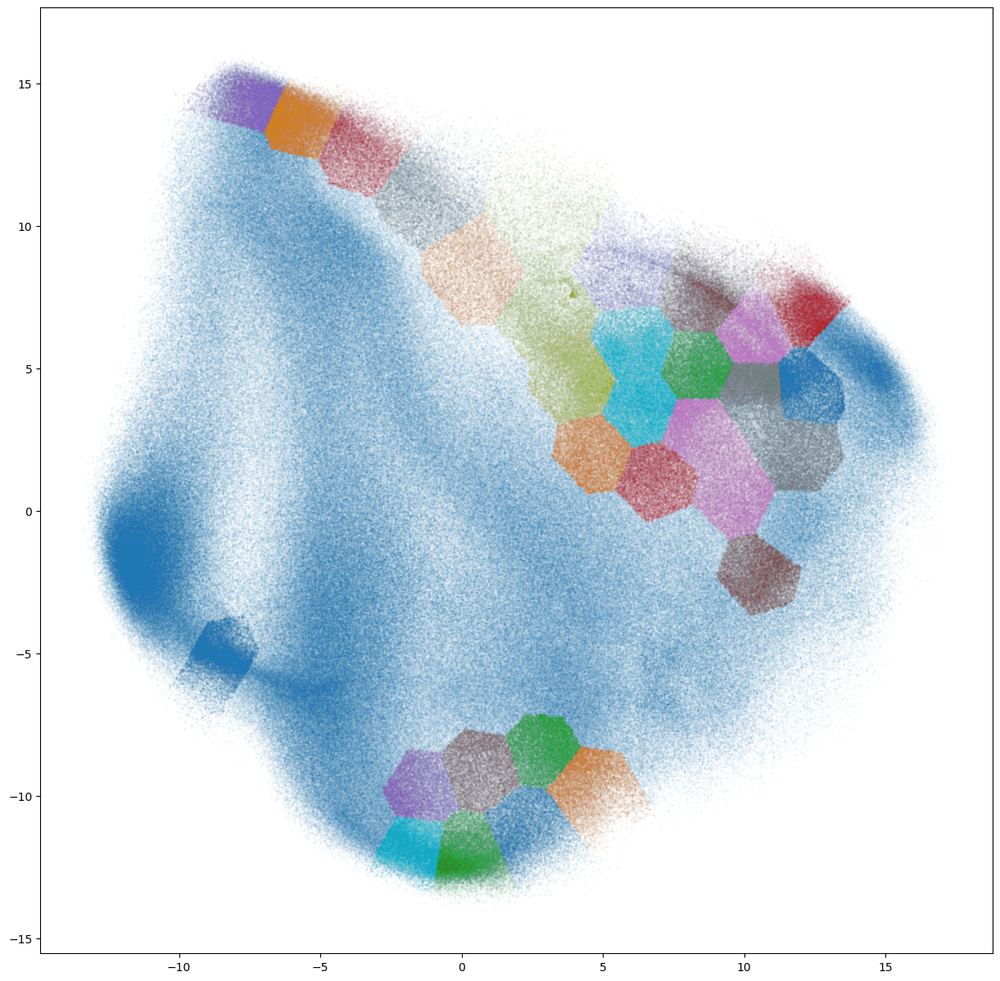

In [7]:
# Black removed and is used for noise instead.
label_predictions=data['labels']
core_samples = np.zeros_like(label_predictions, dtype=bool)
core_samples[label_predictions != -1] = True
unique_labels = set(label_predictions)


fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111)
ax.scatter(data['x'],
           data['y'],
           s=0.0006
          )

relevant_clusters=[]
for k in clusters:
    bird_rate=bird_rate_clusters['bird_detection_rate'][k]

    class_member_mask = label_predictions == k
    #class_member_mask = labels == k
    #if bird_rate>0.6:
    if bird_rate<0.3:
        relevant_clusters.append(k)
        print('Cluster ', k)
        print('Bird detection rate ', bird_rate)
        ax.scatter(data[data['labels']==k]['x'],
                   data[data['labels']==k]['y'],
                   s=0.001
                  )



Cluster  3
Bird detection rate  0.6864082515388454
Cluster  11
Bird detection rate  0.6623357002568364
Cluster  17
Bird detection rate  0.7556663757636205
Cluster  33
Bird detection rate  0.60646813960935
Cluster  37
Bird detection rate  0.6050564739322313
Cluster  39
Bird detection rate  0.6535930763994684
Cluster  51
Bird detection rate  0.7408667243201691
Cluster  52
Bird detection rate  0.6872151853313718
Cluster  53
Bird detection rate  0.6728432873915263
Cluster  55
Bird detection rate  0.6553130650519322
Cluster  64
Bird detection rate  0.6909042834479111
Cluster  66
Bird detection rate  0.6273519020622792
Cluster  71
Bird detection rate  0.6766943717162488
Cluster  82
Bird detection rate  0.6758733762138983
Cluster  88
Bird detection rate  0.6445336968937692
Cluster  98
Bird detection rate  0.7413656996250246
Cluster  99
Bird detection rate  0.7409007044615901


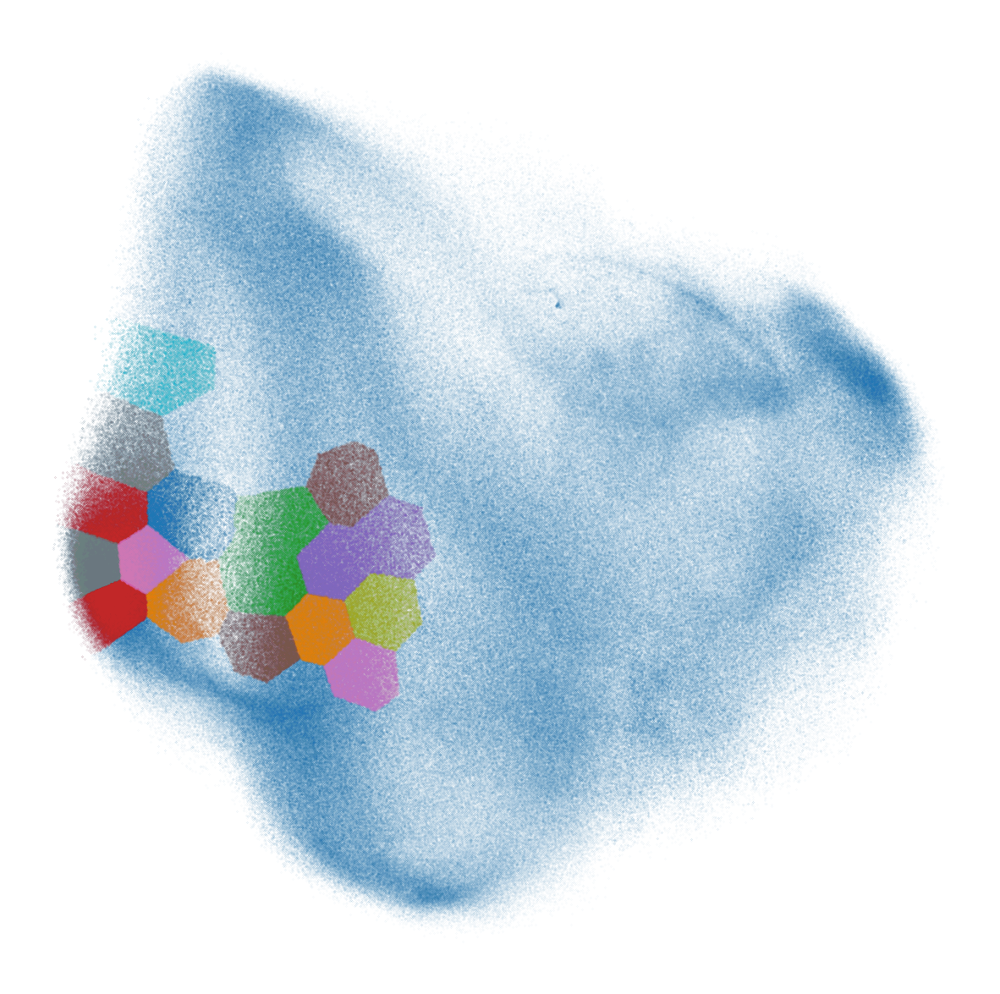

In [8]:
# Black removed and is used for noise instead.
label_predictions=data['labels']
core_samples = np.zeros_like(label_predictions, dtype=bool)
core_samples[label_predictions != -1] = True
unique_labels = sorted(set(label_predictions))


fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111)
ax.scatter(data['x'],
           data['y'],
           s=0.0006
          )

relevant_clusters=[]
for k in clusters:
    bird_rate=bird_rate_clusters['bird_detection_rate'][k]

    class_member_mask = label_predictions == k
    #class_member_mask = labels == k
    if bird_rate>0.6:
#     if bird_rate<0.4:
        relevant_clusters.append(k)
        print('Cluster ', k)
        print('Bird detection rate ', bird_rate)
        ax.scatter(data[data['labels']==k]['x'],
                   data[data['labels']==k]['y'],
                   s=0.001
                  )

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

ax.set_xticks([])
ax.set_yticks([])

plt.savefig(f"pca_low_detection_rate.png", dpi=300)
# plt.savefig(f"pca_high_detection_rate.png", dpi=300)

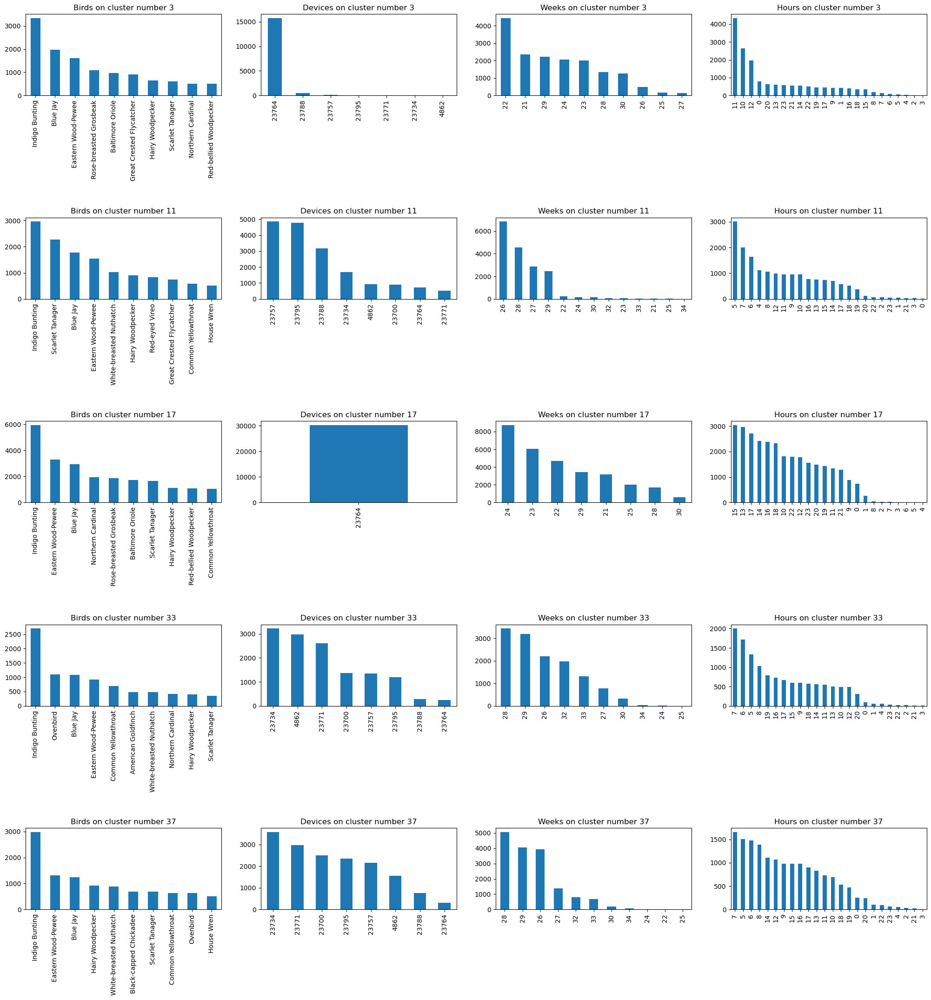

In [9]:
nrows=5
fig, axes = plt.subplots(nrows=nrows, ncols=4, figsize=(25, nrows*5))
for k, label in enumerate(relevant_clusters):
    if k < nrows:
        samples = data[data['labels']==label]
        #samples = samples[samples['confidence']>0.5]
        samples = samples[samples['detection']!='No detection']
        #print(k)
        #print(label)
        samples.detection.value_counts()[0:10].plot.bar(ax=axes[k, 0])
        samples.device.value_counts().plot.bar(ax=axes[k,1])
        samples.week.value_counts().plot.bar(ax=axes[k,2])
        samples.hour.value_counts().plot.bar(ax=axes[k,3])

        
        axes[k, 0].set_title("Birds on cluster number " + str(label))
        axes[k, 1].set_title("Devices on cluster number " + str(label))
        axes[k, 2].set_title("Weeks on cluster number " + str(label))
        axes[k, 3].set_title("Hours on cluster number " + str(label))

fig.subplots_adjust(hspace=1.50)

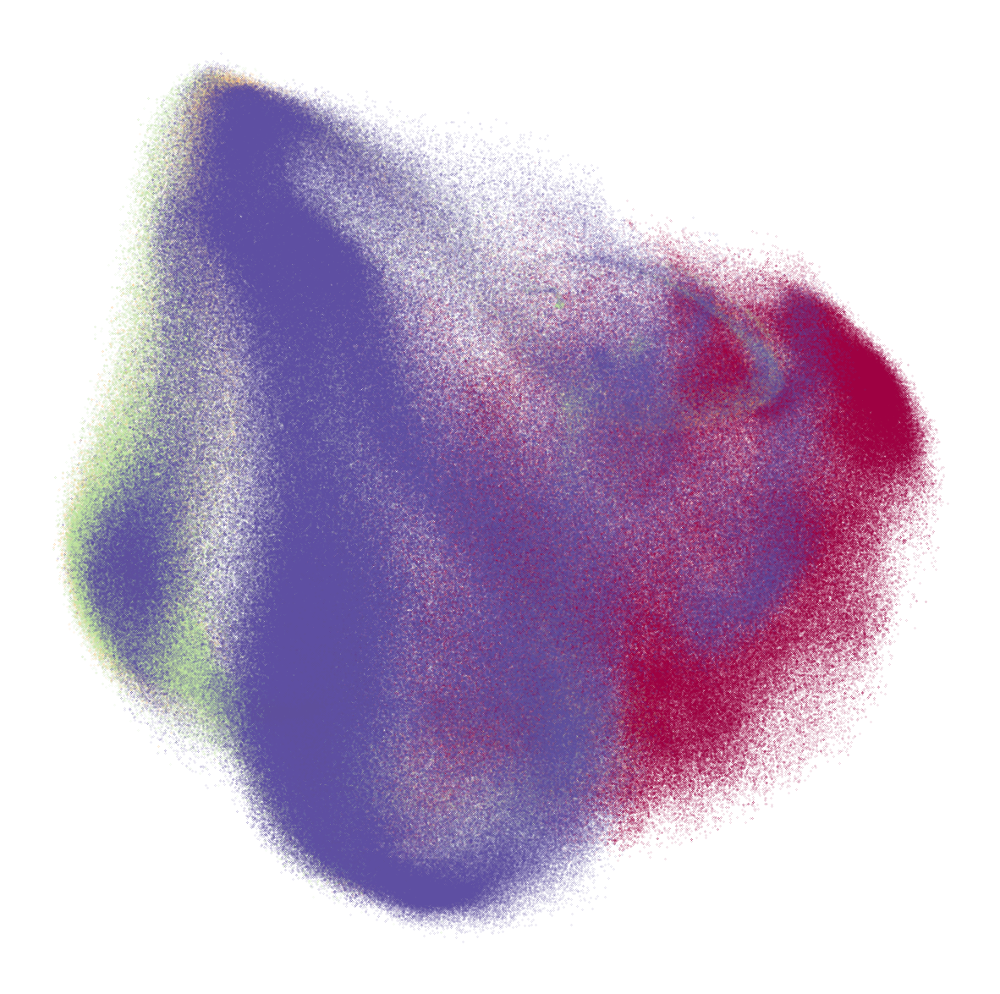

In [10]:
#data1=data[data['detection']!='No detection']
data1=data
# Black removed and is used for noise instead.
column = 'month'
labels = data1[column]
f_embedded = np.transpose(np.array([data1['x'], data1['y']]))
unique_labels = set(data1[column])
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

core_samples_mask = np.zeros_like(labels, dtype=bool)
core_samples_mask[labels != -1] = True
n_noise_points = list(labels).count(-1)


fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111)
patches=[]
for k, col in zip(unique_labels, colors):
    #print('Color ', col)
    #print('Label ', k)

    class_member_mask = labels == k
    xy = f_embedded[class_member_mask & core_samples_mask]
    ax.plot(
        xy[:, 0],
        xy[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor=col,
        markersize=0.1,
    )

    patch = mpatches.Patch(color=col, label=k)
    patches.append(patch)

#ax.legend(handles=patches, fontsize="25")

fig.set_size_inches(15, 15)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

ax.set_xticks([])
ax.set_yticks([])

plt.savefig(f"graphical_abstract.png", dpi=300)

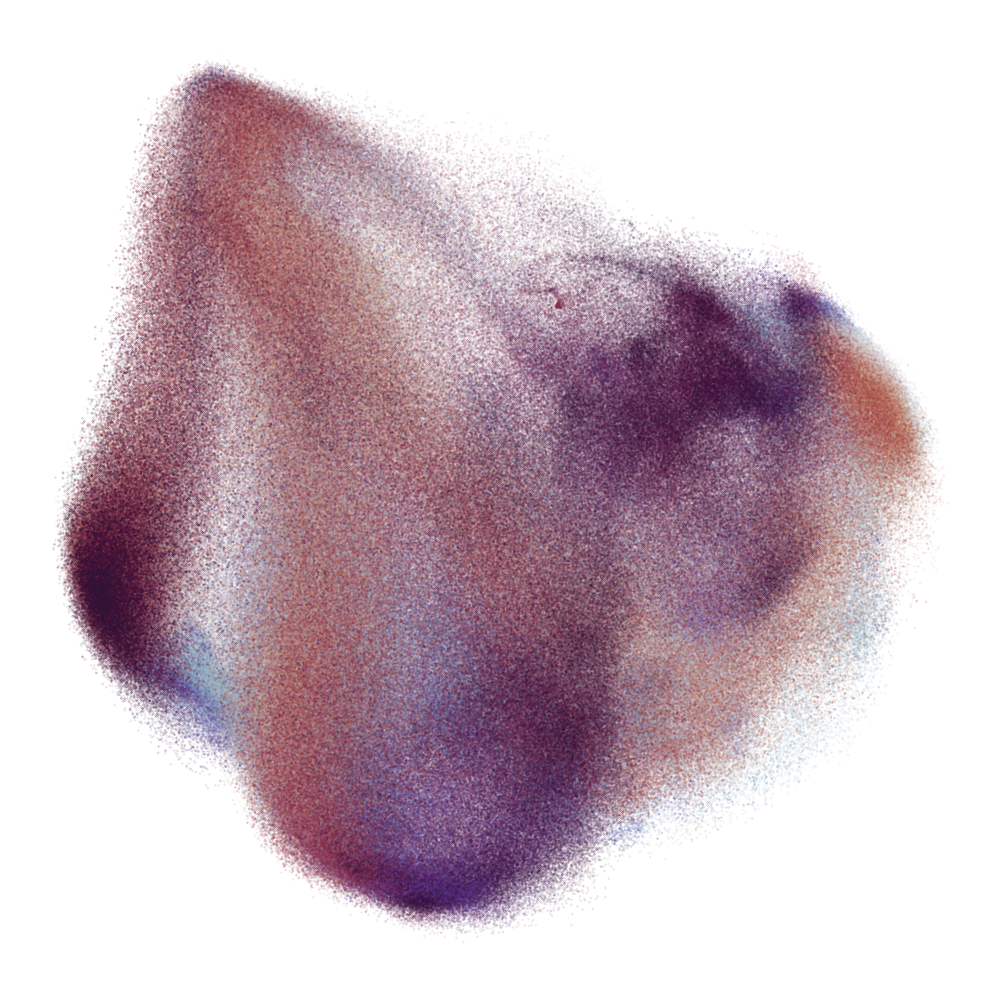

In [11]:
data1=data
column = 'hour'
labels = data1[column]
f_embedded = np.transpose(np.array([data1['x'], data1['y']]))
unique_labels = sorted(set(data1[column]))

cmap = plt.cm.get_cmap("twilight_shifted" if column == 'hour' else 'Spectral')
colors = [cmap(each) for each in np.linspace(0, 1, len(unique_labels))]

core_samples_mask = np.zeros_like(labels, dtype=bool)
core_samples_mask[labels != -1] = True
n_noise_points = list(labels).count(-1)


fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111)
patches=[]
for k, col in zip(unique_labels, colors):
    #print('Color ', col)
    #print('Label ', k)

    class_member_mask = labels == k
    xy = f_embedded[class_member_mask & core_samples_mask]
    ax.plot(
        xy[:, 0],
        xy[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor=col,
        markersize=0.1,
    )

    patch = mpatches.Patch(color=col, label=k)
    patches.append(patch)

# ax.legend(handles=patches, fontsize="25")

fig.set_size_inches(15, 15)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

ax.set_xticks([])
ax.set_yticks([])

plt.savefig(f"pca_{column}.png", dpi=300)